In [3]:
from skimage import io, color, transform, exposure, filters, util
import os
import numpy as np
import matplotlib.pyplot as plt
import warnings
import pandas as pd
from sklearn.preprocessing import maxabs_scale, minmax_scale
warnings.filterwarnings('ignore')

%matplotlib inline

# IO functions

In [6]:
def load_images(dir, gray=False):
    images = pd.DataFrame()
    for path in dir:
        imgs_tmp = []
        labels = []
        for i, file in enumerate(os.listdir(path)):
            img = io.imread(os.path.join(path,file))
            img = transform.resize(img, (150, 150))
            if gray:
                img = color.rgb2gray(img)
            if img is not None:
                imgs_tmp.append(img)
                labels.append(file)            
        df = pd.DataFrame({'img':imgs_tmp, 'label':labels})
        df['class'] = [0 if path[-2] == 'n' else 1 for x in labels]
        images = images.append(df, ignore_index=True)
    return images

In [7]:
def save_images(dir, images, func = None, **params):
    try:
        for i in range(len(images)):
            image = images.iloc[i]['img']
            name = images.iloc[i]['label']
            clss = images.iloc[i]['class']

            path = dir[1] if clss else dir[0]
            if func is not None:
                io.imsave(os.path.join(path,name), func(image, **params))
            else:    
                io.imsave(os.path.join(path,name), image)
    except Exception as err:
        print(err)

In [8]:
def scale(img):
    return util.img_as_ubyte(img)

# Testando implementação


In [9]:
base = '$/disciplinas/VISAOC/atividades/atv1/datasets/original/'

In [11]:
images = load_images([base+'n/', base+'p/'])

In [7]:
#laplace = base.replace('original','laplace')
#test1 = [images[0][f'{i}.jpg'] for i in range(4)]
#save_images([laplace+'n/', laplace+'p/'], images)

# Armazenando Resultados

In [12]:
equalize = base.replace('original','equalize_hist')
save_images([equalize+'n/', equalize+'p/'], images, exposure.equalize_hist)

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

In [13]:
gamma1 = base.replace('original','gamma_correction1')
save_images([gamma1+'n/', gamma1+'p/'], images, exposure.adjust_gamma, gamma=0.7)

gamma2 = base.replace('original','gamma_correction2')
save_images([gamma2+'n/', gamma2+'p/'], images, exposure.adjust_gamma, gamma=1.4)

gamma3 = base.replace('original','gamma_correction3')
save_images([gamma3+'n/', gamma3+'p/'], images, exposure.adjust_gamma, gamma=2.1)

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

In [14]:
gaussian = base.replace('original','gaussian')
save_images([gaussian+'n/', gaussian+'p/'], images, filters.gaussian, sigma=1.3)

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0

In [15]:
images = load_images([base+'n/', base+'p/'], True)
laplace = base.replace('original','laplace')
save_images([laplace+'n/', laplace+'p/'], images, filters.laplace)

Lossy conversion from float64 to uint8. Range [-0.5462816409411785, 0.5727287289411664]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [-0.5989217703703671, 0.6709553488453243]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [-0.5703176039215719, 0.48314768988234824]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [-0.7011831686274653, 0.5732241406535811]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [-0.5620348940130717, 0.5990179061960682]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [-0.5892404266405182, 0.4887307277908577]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [-0.6863541656470432, 0.47899

# Conjunto de teste

In [16]:
test1 = [images['img'][i] for i in range(4)]
#del images

# Roteiro 1

## Roteiro 1.a - equalização de histograma

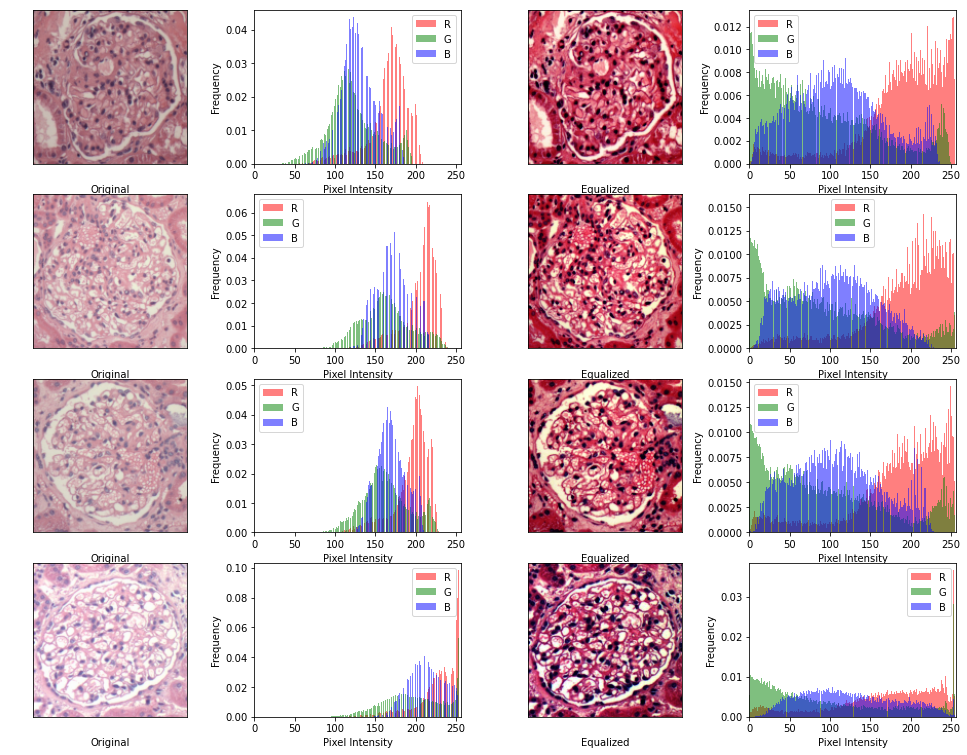

In [9]:
fig, axes = plt.subplots(4,4,figsize=(17,13))
for i, img in enumerate(test1):
    x = img.copy()
    axes[i][0].imshow(x)
    axes[i][0].set_xlabel('Original')
    axes[i][0].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)

    y = exposure.equalize_hist(x)
    axes[i][2].imshow(y)
    axes[i][2].set_xlabel('Equalized')
    axes[i][2].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)

    _ = axes[i][1].hist(scale(x)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
    _ = axes[i][1].hist(scale(x)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True, label='G')
    _ = axes[i][1].hist(scale(x)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='B')
    axes[i][1].set_xlim(0,256)
    axes[i][1].set_ylabel('Frequency')
    axes[i][1].set_xlabel('Pixel Intensity')
    axes[i][1].legend()
    #axes[i][1].set_ylim(0,0.1)

    _ = axes[i][3].hist(scale(y)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
    _ = axes[i][3].hist(scale(y)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True, label='G')
    _ = axes[i][3].hist(scale(y)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='B')
    axes[i][3].set_ylabel('Frequency')
    axes[i][3].set_xlabel('Pixel Intensity')
    axes[i][3].set_xlim(0,256)
    #axes[i][3].set_ylim(0,0.1)
    axes[i][3].legend()


## Roteiro 1.b - correção de gamma

### correção de gamma 1

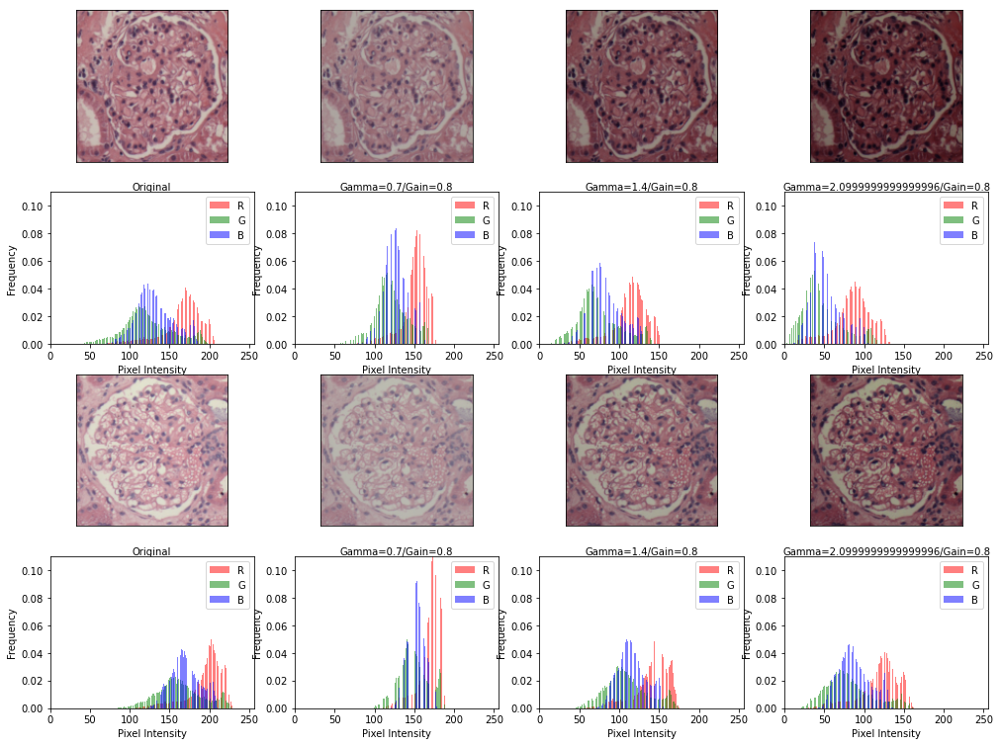

In [10]:
fig, axes = plt.subplots(4,4,figsize=(17,13))
for i, img in enumerate(test1):
    for j in range(4):
        x = test1[i-(i%2)].copy()
        y = exposure.adjust_gamma(x,0.7*(j),0.8)
        if not i%2 and not j:
            axes[i][j].imshow(x)
            axes[i][j].set_xlabel('Original')
            axes[i][j].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
        if not j and i%2:
            _ = axes[i][j].hist(scale(x)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
            _ = axes[i][j].hist(scale(x)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True, label='G')
            _ = axes[i][j].hist(scale(x)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='B')
            axes[i][j].set_xlim(0,256)
            axes[i][j].set_ylim(0,0.11)
            axes[i][j].set_ylabel('Frequency')
            axes[i][j].set_xlabel('Pixel Intensity')
            axes[i][j].legend()
        if j and not i%2:
            axes[i][j].imshow(y)
            axes[i][j].set_xlabel(f'Gamma={0.7*(j)}/Gain=0.8')
            axes[i][j].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
        if j and i%2: 
            _ = axes[i][j].hist(scale(y)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
            _ = axes[i][j].hist(scale(y)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True, label='G')
            _ = axes[i][j].hist(scale(y)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='B')
            axes[i][j].set_xlim(0,256)
            axes[i][j].set_ylim(0,0.11)
            axes[i][j].set_ylabel('Frequency')
            axes[i][j].set_xlabel('Pixel Intensity')
            axes[i][j].legend()

### correção de gamma 2

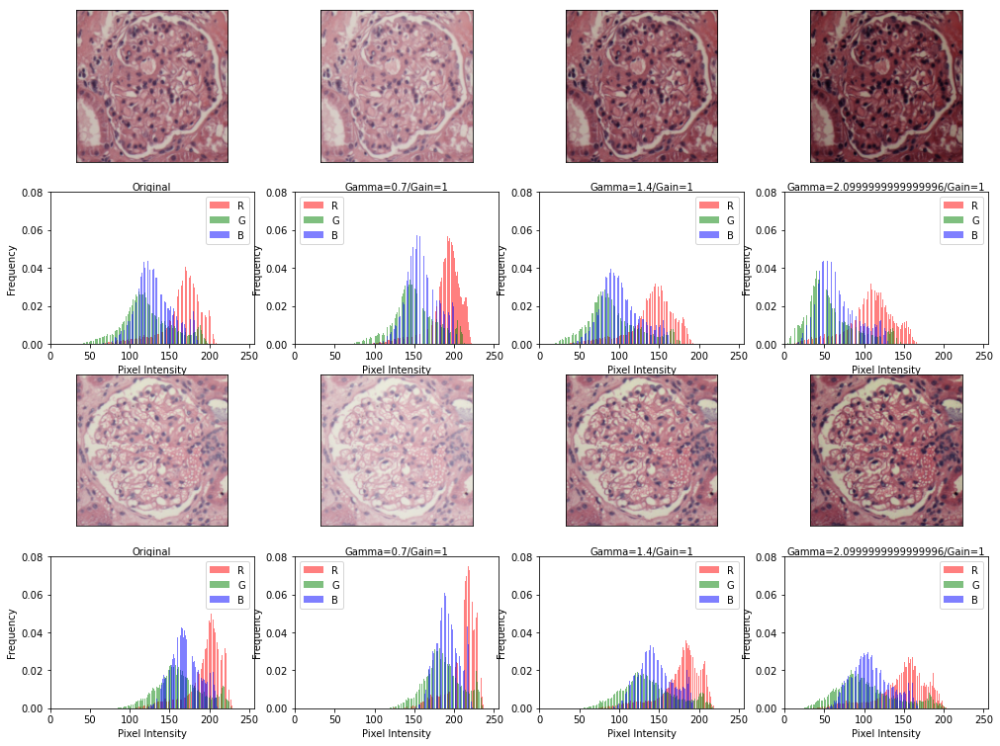

In [11]:
fig, axes = plt.subplots(4,4, figsize=(17,13))
for i, img in enumerate(test1):
    for j in range(4):
        x = test1[i-(i%2)].copy()
        y = exposure.adjust_gamma(x,0.7*(j),1)
        if not i%2 and not j:
            axes[i][j].imshow(x)
            axes[i][j].set_xlabel('Original')
            axes[i][j].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
        if not j and i%2:
            _ = axes[i][j].hist(scale(x)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
            _ = axes[i][j].hist(scale(x)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True, label='G')
            _ = axes[i][j].hist(scale(x)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='B')
            axes[i][j].set_xlim(0,256)
            axes[i][j].set_ylim(0,0.08)
            axes[i][j].set_ylabel('Frequency')
            axes[i][j].set_xlabel('Pixel Intensity')
            axes[i][j].legend()
        if j and not i%2:
            axes[i][j].imshow(y)
            axes[i][j].set_xlabel(f'Gamma={0.7*(j)}/Gain=1')
            axes[i][j].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
        if j and i%2: 
            _ = axes[i][j].hist(scale(y)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
            _ = axes[i][j].hist(scale(y)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True, label='G')
            _ = axes[i][j].hist(scale(y)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='B')
            axes[i][j].set_xlim(0,256)
            axes[i][j].set_ylim(0,0.08)
            axes[i][j].set_ylabel('Frequency')
            axes[i][j].set_xlabel('Pixel Intensity')
            axes[i][j].legend()

### correção de gamma 3

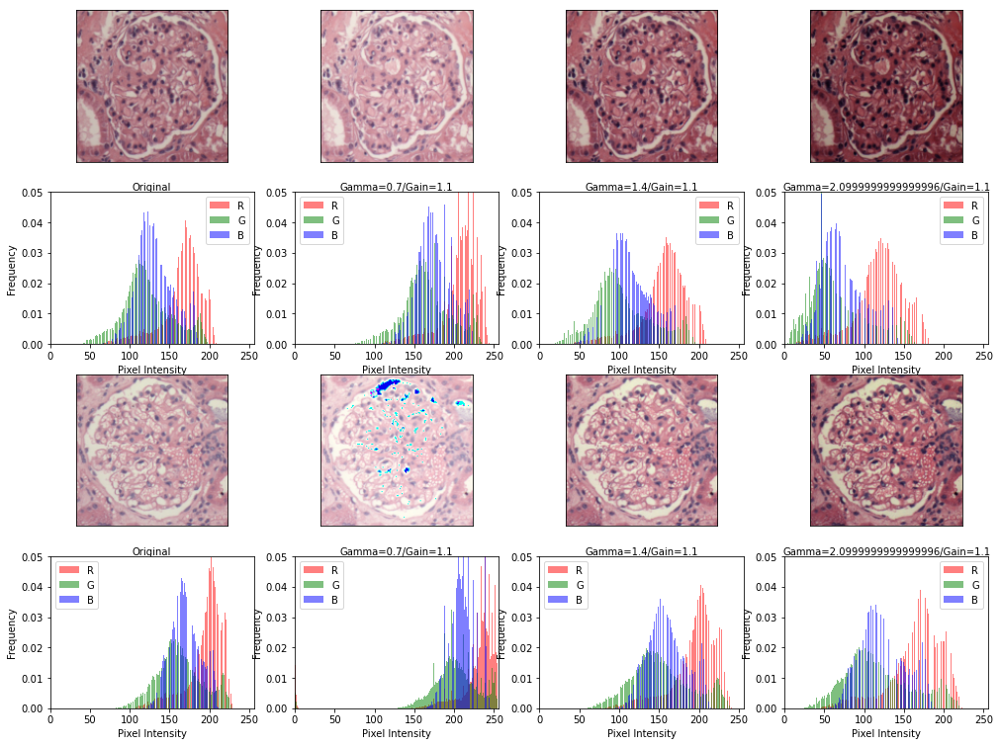

In [12]:
fig, axes = plt.subplots(4,4,figsize=(17,13))
for i, img in enumerate(test1):
    for j in range(4):
        x = test1[i-(i%2)].copy()
        x = scale(x)
        y = exposure.adjust_gamma(x,0.7*(j),1.1)
        if not i%2 and not j:
            axes[i][j].imshow(x)
            axes[i][j].set_xlabel('Original')
            axes[i][j].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
        if not j and i%2:
            _ = axes[i][j].hist(scale(x)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
            _ = axes[i][j].hist(scale(x)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True, label='G')
            _ = axes[i][j].hist(scale(x)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='B')
            axes[i][j].set_xlim(0,256)
            axes[i][j].set_ylim(0,0.05)
            axes[i][j].set_ylabel('Frequency')
            axes[i][j].set_xlabel('Pixel Intensity')
            axes[i][j].legend()
        if j and not i%2:
            axes[i][j].imshow(y)
            axes[i][j].set_xlabel(f'Gamma={0.7*(j)}/Gain=1.1')
            axes[i][j].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
        if j and i%2: 
            _ = axes[i][j].hist(scale(y)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
            _ = axes[i][j].hist(scale(y)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True, label='G')
            _ = axes[i][j].hist(scale(y)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='B')
            axes[i][j].set_xlim(0,256)
            axes[i][j].set_ylim(0,0.05)
            axes[i][j].set_ylabel('Frequency')
            axes[i][j].set_xlabel('Pixel Intensity')
            axes[i][j].legend()

## Roteiro 1.c - filtro gaussiano

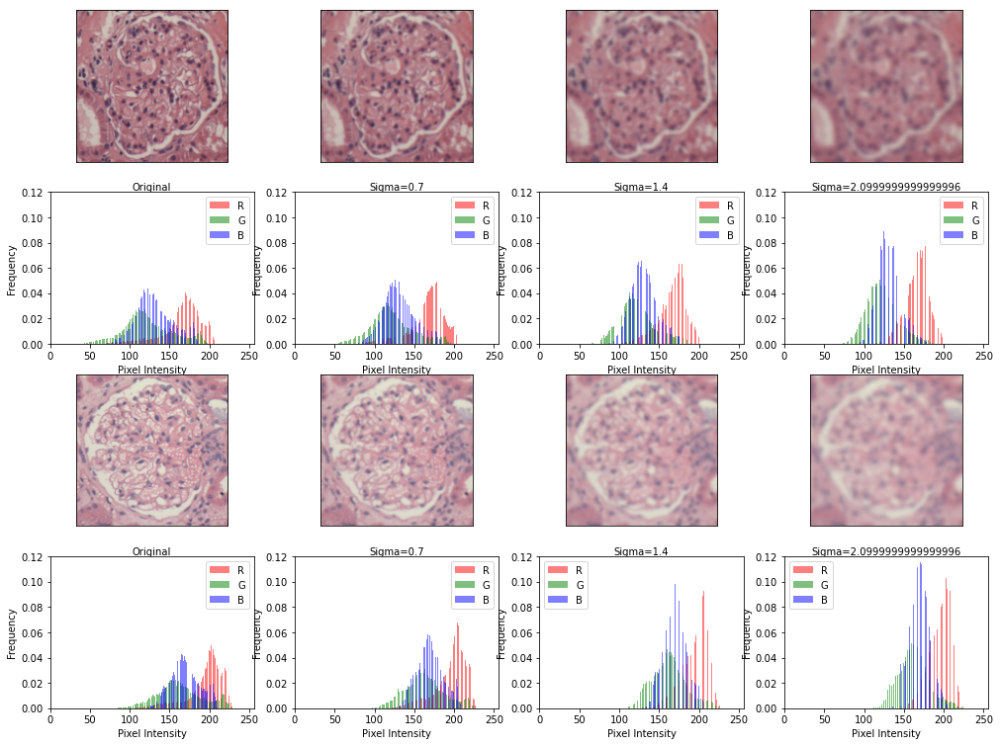

In [13]:
fig, axes = plt.subplots(4,4, figsize=(17,13))
for i, img in enumerate(test1):
    for j in range(4):
        x = test1[i-(i%2)].copy()
        y = filters.gaussian(x, 0.7*j)
        if not i%2 and not j:
            axes[i][j].imshow(x)
            axes[i][j].set_xlabel('Original')
            axes[i][j].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
        if not j and i%2:
            _ = axes[i][j].hist(scale(x)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
            _ = axes[i][j].hist(scale(x)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True, label='G')
            _ = axes[i][j].hist(scale(x)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='B')
            axes[i][j].set_xlim(0,256)
            axes[i][j].set_ylim(0,0.12)
            axes[i][j].set_ylabel('Frequency')
            axes[i][j].set_xlabel('Pixel Intensity')
            axes[i][j].legend()
        if j and not i%2:
            axes[i][j].imshow(y)
            axes[i][j].set_xlabel(f'Sigma={0.7*j}')
            axes[i][j].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
        if j and i%2: 
            _ = axes[i][j].hist(scale(y)[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True, label='R')
            _ = axes[i][j].hist(scale(y)[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True, label='G')
            _ = axes[i][j].hist(scale(y)[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='B')
            axes[i][j].set_xlim(0,256)
            axes[i][j].set_ylim(0,0.12)
            axes[i][j].set_ylabel('Frequency')
            axes[i][j].set_xlabel('Pixel Intensity')
            axes[i][j].legend()

## Roteiro 1.d - filtro de laplace

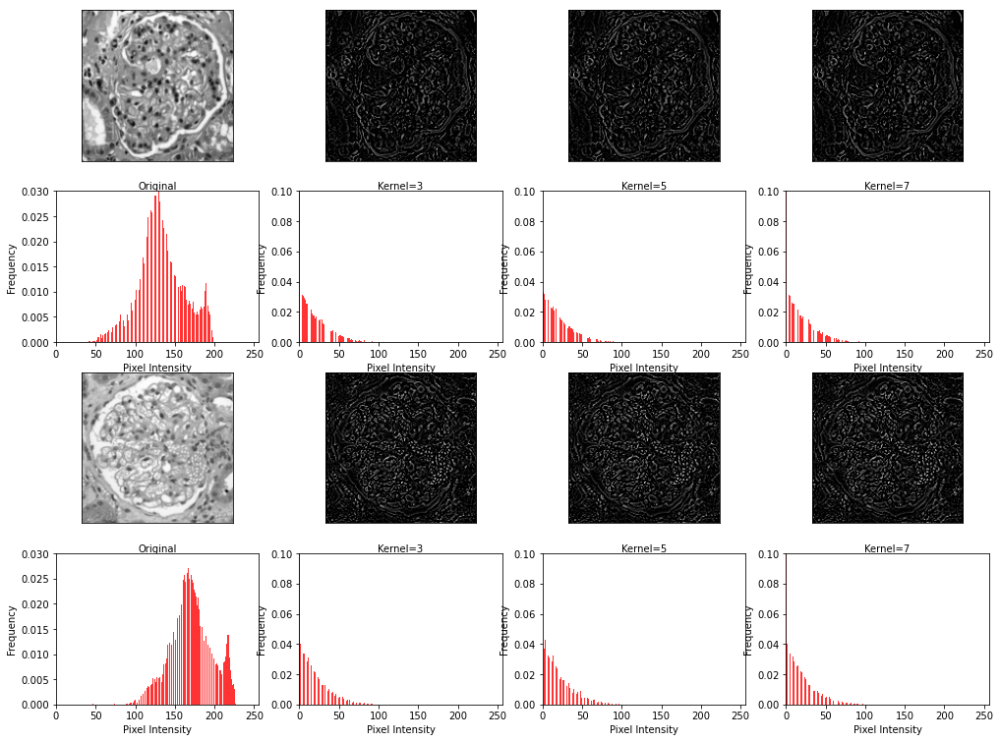

In [14]:
fig, axes = plt.subplots(4,4, figsize=(17,13))
kernel = [3, 5, 7]
for i, img in enumerate(test1):
    for j in range(4):
        x = test1[i-(i%2)].copy()
        x = color.rgb2gray(scale(x))
        y = scale(x)
        if j:
            y = filters.laplace(y,ksize=kernel[j-1])
            y = scale(y)
        if not i%2 and not j:
            axes[i][j].imshow(x, cmap='gray')
            axes[i][j].set_xlabel('Original')
            axes[i][j].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
        if not j and i%2:
            _ = axes[i][j].hist(scale(x).ravel(), bins = 256, color = 'red', alpha = 0.8, density=True)
            axes[i][j].set_xlim(0,256)
            axes[i][j].set_ylim(0,0.03)
            axes[i][j].set_ylabel('Frequency')
            axes[i][j].set_xlabel('Pixel Intensity')
        if j and not i%2:
            axes[i][j].imshow(y, cmap='gray')
            axes[i][j].set_xlabel(f'Kernel={kernel[j-1]}')
            axes[i][j].tick_params(labelcolor='none', top=False, bottom=False, left=False, right=False)
        if j and i%2: 
            _ = axes[i][j].hist(scale(y).ravel(), bins = 256, color = 'red', alpha = 0.8, density=True)
            axes[i][j].set_xlim(0,256)
            axes[i][j].set_ylim(0,0.1)
            axes[i][j].set_ylabel('Frequency')
            axes[i][j].set_xlabel('Pixel Intensity')

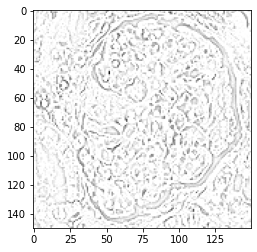

In [15]:
x = test1[0].copy()
x = color.rgb2gray(scale(x))
y = scale(x)
y = filters.laplace(y)
y = scale(y)
y = ~y
plt.imshow(y, cmap='gray')

# Roteiro 2

In [16]:
def light_intensity(img, scalar):
    img = img.astype('float32')
    for i in range(3):
        img[:,:,i] *= scalar
    return img

In [17]:
def light_shift(img, scalar):
    img = img.astype('float32')
    for i in range(3):
        img[:,:,i] += scalar
    return img

In [18]:
def light_shift_and_intensity(img, scalar1, scalar2):
    img = img.astype('float32')
    img = light_intensity(img, scalar1)
    img = light_shift(img, scalar2)
    return img

In [19]:
def o1_o2(img):
    img = img.astype('float32')
    o1 = (img[:,:,0] - img[:,:,1])/np.sqrt(2)
    o2 = (img[:,:,0] + img[:,:,1] - 2*img[:,:,2])/np.sqrt(6)
    return o1, o2

In [20]:
def transformed_color(img):
    img = img.astype('float32')
    for i in range(3):
        img[:,:,i] = (img[:,:,i]- np.mean(img[:,:,i]))/np.std(img[:,:,i])
    return img

In [18]:
test = [images['img'][i] for i in range(4)]
#del images

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


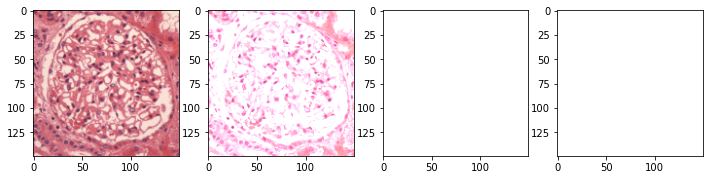

In [22]:
fig, axes = plt.subplots(1,4, figsize=(12,12))
axes[0].imshow(test[0])
axes[1].imshow(light_intensity(test[0].copy(),2))
axes[2].imshow(light_shift(test[0].copy(),40))
axes[3].imshow(light_shift_and_intensity(test[0].copy(),2,50))


In [23]:
o1, o2 = o1_o2(test[0].copy())
#print(o1, o2)

## Roteiro 2.a - RGB Histogram

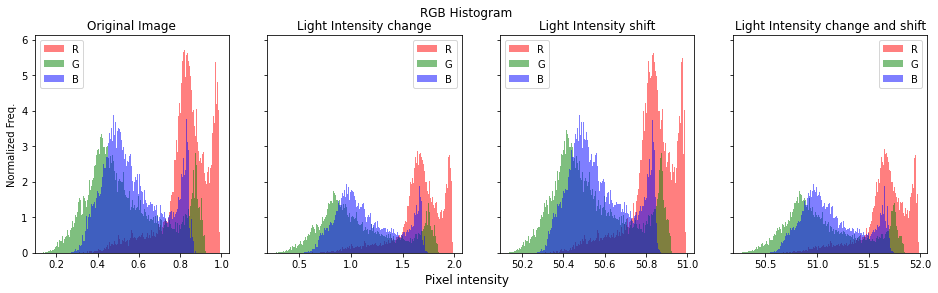

In [24]:
fig, axes = plt.subplots(1,4, sharey=True, figsize=(16,4))
fig.suptitle('RGB Histogram')
fig.supxlabel('Pixel intensity')

sc = test[0].copy()
_ = axes[0].hist(sc[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True,label='R')
_ = axes[0].hist(sc[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True,label='G')
_ = axes[0].hist(sc[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True,label='B')
axes[0].set_title('Original Image')
axes[0].set_ylabel('Normalized Freq.')
axes[0].legend()

li = light_intensity(test[0].copy(),2)
_ = axes[1].hist(li[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True,label='R')
_ = axes[1].hist(li[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True,label='G')
_ = axes[1].hist(li[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True,label='B')
axes[1].set_title('Light Intensity change')
axes[1].legend()

ls = light_shift(test[0].copy(),50)
_ = axes[2].hist(ls[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True,label='R')
_ = axes[2].hist(ls[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True,label='G')
_ = axes[2].hist(ls[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True,label='B')
axes[2].set_title('Light Intensity shift')
axes[2].legend()

lsi = light_shift_and_intensity(test[0].copy(),2,50)
_ = axes[3].hist(lsi[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True,label='R')
_ = axes[3].hist(lsi[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True,label='G')
_ = axes[3].hist(lsi[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True,label='B')
axes[3].set_title('Light Intensity change and shift')
axes[3].legend()

## Roteiro 2.b - O1, O2

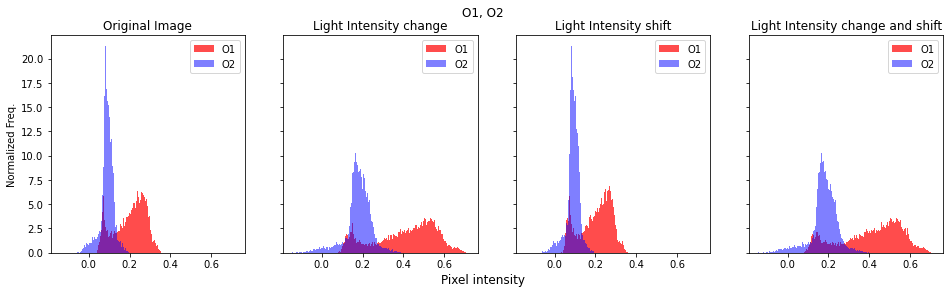

In [27]:
fig, axes = plt.subplots(1,4, sharey=True, sharex=True, figsize=(16,4))
fig.supxlabel('Pixel intensity')
fig.suptitle('O1, O2')


o1, o2 = o1_o2(test[0].copy())
_ = axes[0].hist(o1.flatten(), bins = 256, color = 'red', alpha = 0.7, density=True, label='O1')
_ = axes[0].hist(o2.flatten(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='O2')
axes[0].set_title('Original Image')
axes[0].set_ylabel('Normalized Freq.')
axes[0].legend()

li = light_intensity(test[0].copy(),2)
lio1, lio2 = o1_o2(li)
_ = axes[1].hist(lio1.flatten(), bins = 256, color = 'red', alpha = 0.7, density=True, label='O1')
_ = axes[1].hist(lio2.flatten(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='O2')
axes[1].set_title('Light Intensity change')
axes[1].legend()

ls = light_shift(test[0].copy(),50)
lso1, lso2 = o1_o2(ls)
_ = axes[2].hist(lso1.flatten(), bins = 256, color = 'red', alpha = 0.7, density=True, label='O1')
_ = axes[2].hist(lso2.flatten(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='O2')
axes[2].set_title('Light Intensity shift')
axes[2].legend()

lsi = light_shift_and_intensity(test[0].copy(),2,50)
lsio1, lsio2 = o1_o2(li)
_ = axes[3].hist(lsio1.flatten(), bins = 256, color = 'red', alpha = 0.7, density=True, label='O1')
_ = axes[3].hist(lsio2.flatten(), bins = 256, color = 'blue', alpha = 0.5, density=True, label='O2')
axes[3].set_title('Light Intensity change and shift')
axes[3].legend()


## Roteiro 2.c - Transformed Color

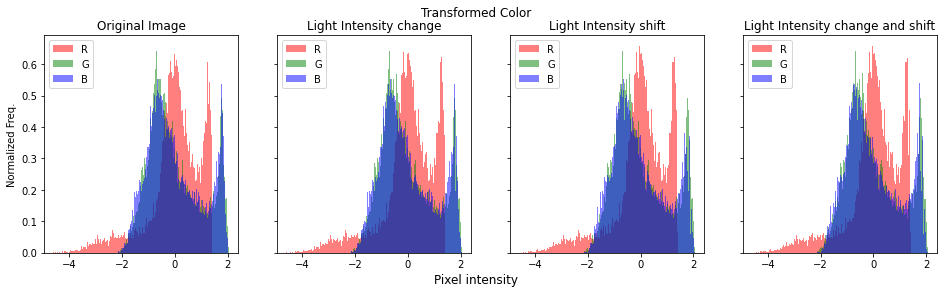

In [29]:
fig, axes = plt.subplots(1,4, sharey=True, figsize=(16,4))
fig.suptitle('Transformed Color')
fig.supxlabel('Pixel intensity')

img = test[0].copy()
sc = transformed_color(img)
_ = axes[0].hist(sc[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True,label='R')
_ = axes[0].hist(sc[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True,label='G')
_ = axes[0].hist(sc[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True,label='B')
axes[0].set_title('Original Image')
axes[0].set_ylabel('Normalized Freq.')
axes[0].legend()

li = light_intensity(img,2)
lit = transformed_color(li)
_ = axes[1].hist(lit[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True,label='R')
_ = axes[1].hist(lit[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True,label='G')
_ = axes[1].hist(lit[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True,label='B')
axes[1].set_title('Light Intensity change')
axes[1].legend()

ls = light_shift(img,50)
lst = transformed_color(ls)
_ = axes[2].hist(lst[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True,label='R')
_ = axes[2].hist(lst[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True,label='G')
_ = axes[2].hist(lst[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True,label='B')
axes[2].set_title('Light Intensity shift')
axes[2].legend()

lsi = light_shift_and_intensity(img,2,50)
lsit = transformed_color(lsi)
_ = axes[3].hist(lsit[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5, density=True,label='R')
_ = axes[3].hist(lsit[:, :, 1].ravel(), bins = 256, color = 'green', alpha = 0.5, density=True,label='G')
_ = axes[3].hist(lsit[:, :, 2].ravel(), bins = 256, color = 'blue', alpha = 0.5, density=True,label='B')
axes[3].set_title('Light Intensity change and shift')
axes[3].legend()